In [1]:
from super_image import HanModel, ImageLoader

MODEL = HanModel.from_pretrained("eugenesiow/han", scale=4)
print("Model loaded")


c:\Users\ianmc\image_enhance_project\venv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
c:\Users\ianmc\image_enhance_project\venv\lib\site-packages\huggingface_hub\file_download.py:655: FutureWarning: 'cached_download' is the legacy way to download files from the HF hub, please consider upgrading to 'hf_hub_download'
  warnings.warn(


https://huggingface.co/eugenesiow/han/resolve/main/pytorch_model_4x.pt
Model loaded


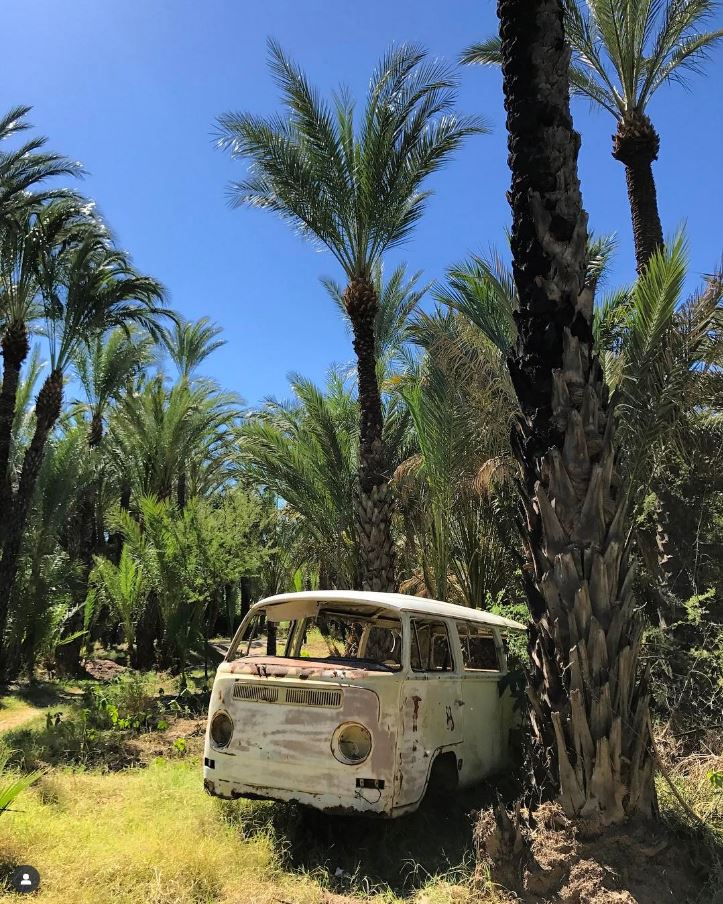

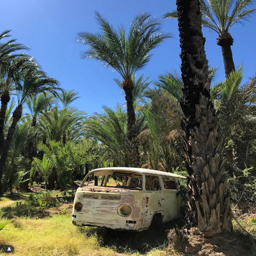

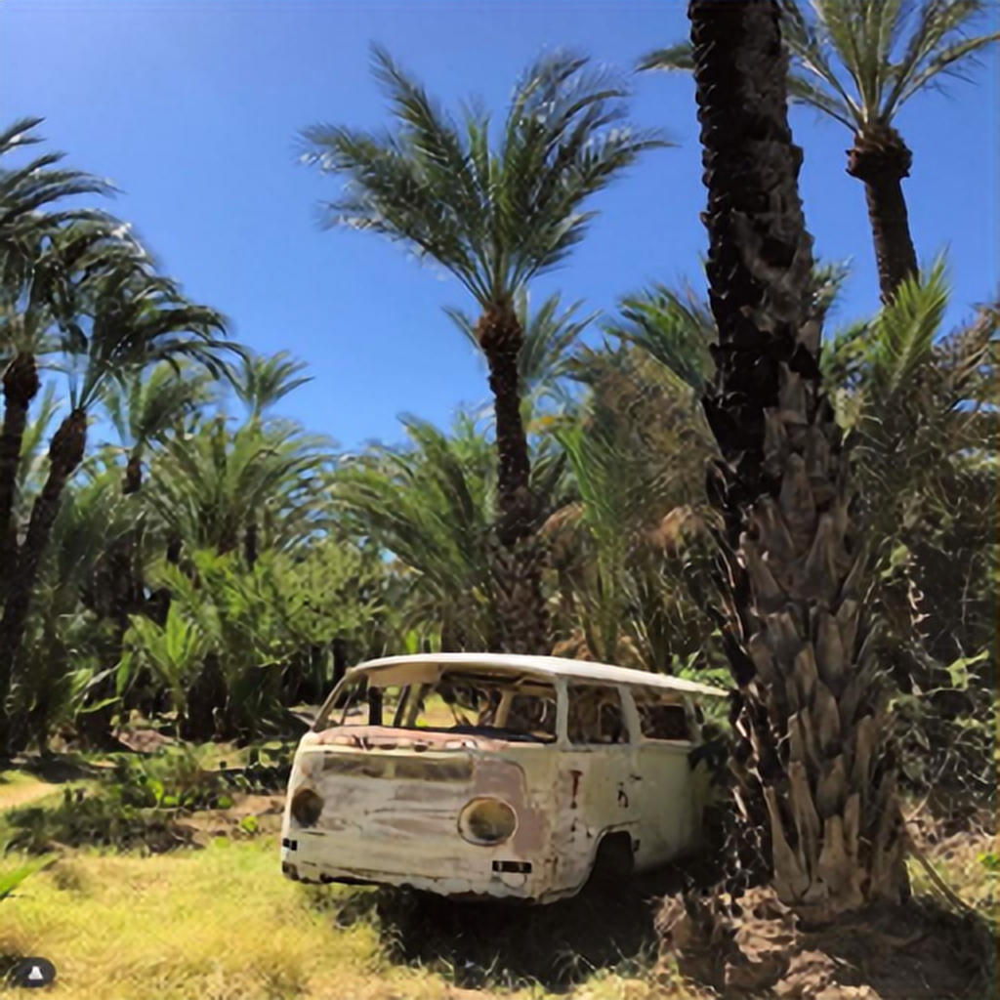

In [5]:
from PIL import Image

img = Image.open("bus_baja_full.JPG").convert("RGB")
display(img)
# Make image smaller so cpu wont crash till we test
img_small = img.resize((256, 256))
display(img_small)
inputs = ImageLoader.load_image(img_small)
preds = MODEL(inputs)
# Save to disk
ImageLoader.save_image(preds, "temp_sr.png")

# Load back as PIL image and display
sr_img = Image.open("temp_sr.png").convert("RGB")
display(sr_img)

In [ ]:
# all code below this is just other approaches and checks 

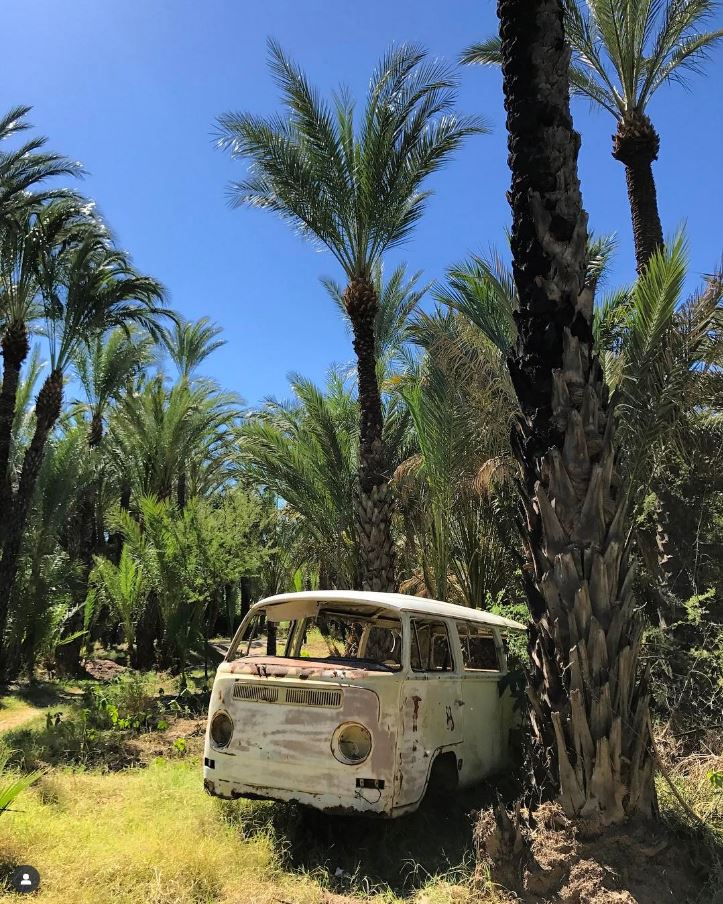

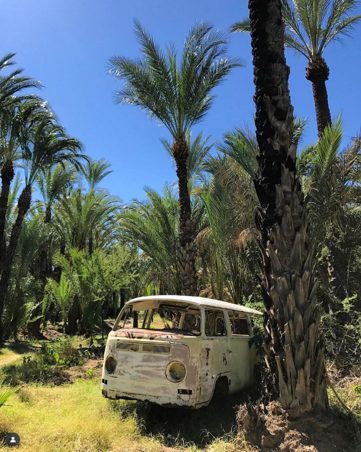

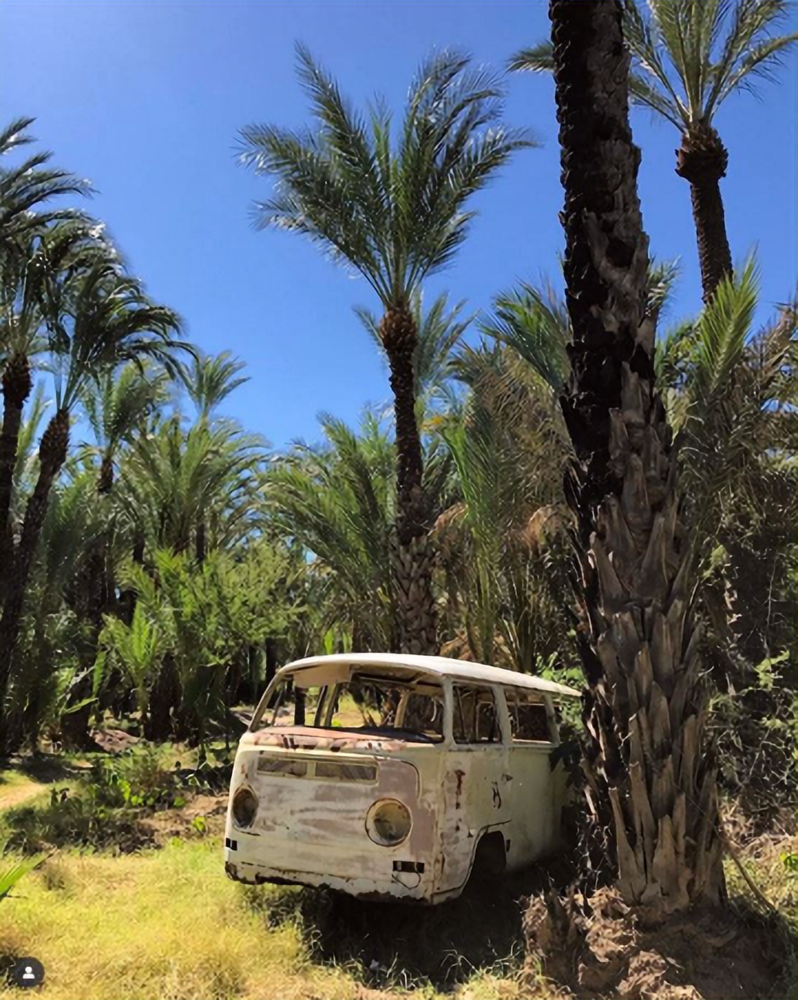

Original: (723, 904)
Half-size input: (361, 452)
SR from half-size: (1444, 1808)


In [6]:
# Reload original image from disk
img_orig = Image.open("bus_baja_full.JPG").convert("RGB")
display(img_orig)

# Make a half-size version
w, h = img_orig.size
img_half = img_orig.resize((w // 2, h // 2))
display(img_half)

# Run HAN on the half-size image
inputs = ImageLoader.load_image(img_half)
preds = MODEL(inputs)

ImageLoader.save_image(preds, "temp_sr_half.png")
sr_half = Image.open("temp_sr_half.png").convert("RGB")
display(sr_half)

print("Original:", img_orig.size)
print("Half-size input:", img_half.size)
print("SR from half-size:", sr_half.size)

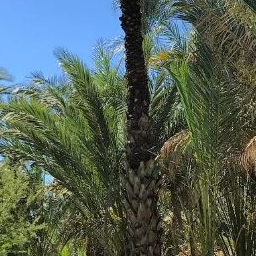

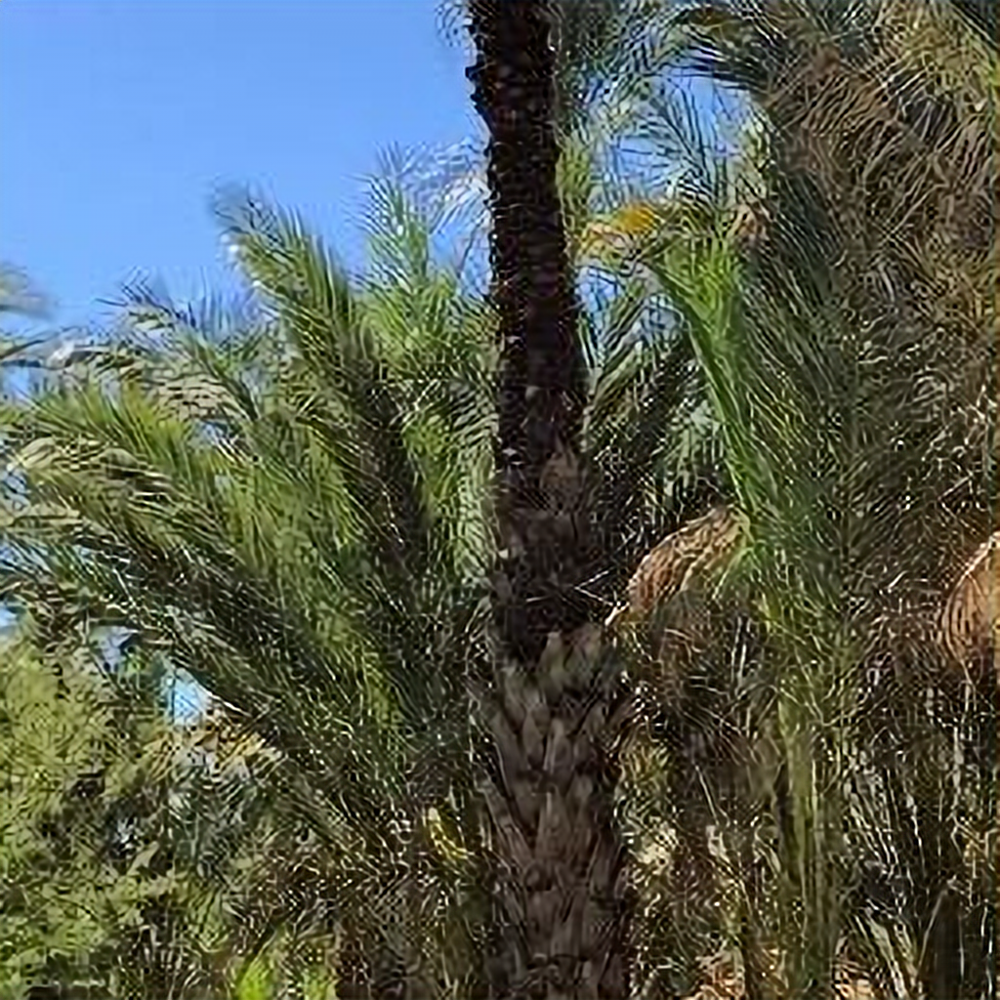

Crop: (256, 256)
SR crop: (1024, 1024)


In [7]:
img_orig = Image.open("bus_baja_full.JPG").convert("RGB")

# Take a 256x256 center crop
w, h = img_orig.size
crop_size = 256
left = (w - crop_size) // 2
top = (h - crop_size) // 2
right = left + crop_size
bottom = top + crop_size
img_crop = img_orig.crop((left, top, right, bottom))
display(img_crop)

inputs = ImageLoader.load_image(img_crop)
preds = MODEL(inputs)

ImageLoader.save_image(preds, "temp_sr_crop.png")
sr_crop = Image.open("temp_sr_crop.png").convert("RGB")
display(sr_crop)

print("Crop:", img_crop.size)
print("SR crop:", sr_crop.size)


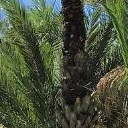

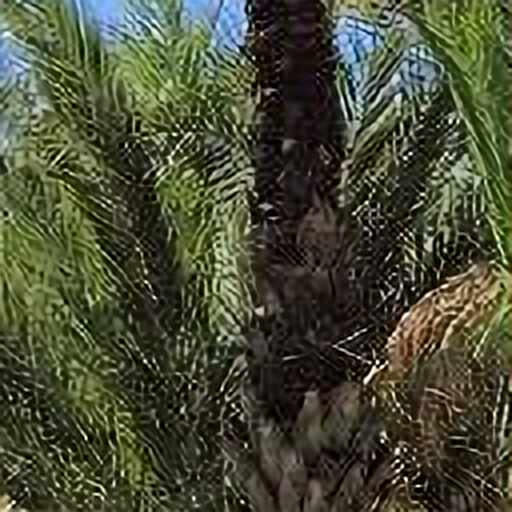

Crop: (128, 128)
SR crop: (512, 512)


In [8]:
img_orig = Image.open("bus_baja_full.JPG").convert("RGB")

# Take a 128x128 center crop for fast testing
crop_size = 128
w, h = img_orig.size
left = (w - crop_size) // 2
top = (h - crop_size) // 2
right = left + crop_size
bottom = top + crop_size

img_crop = img_orig.crop((left, top, right, bottom))
display(img_crop)

inputs = ImageLoader.load_image(img_crop)
preds = MODEL(inputs)

ImageLoader.save_image(preds, "temp_sr_crop_128.png")
sr_crop = Image.open("temp_sr_crop_128.png").convert("RGB")
display(sr_crop)

print("Crop:", img_crop.size)
print("SR crop:", sr_crop.size)
